In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv("/content/fashion_trend_data (1).csv")
print(df)

        Trend_ID  Trend_Name       Category  Subcategory  \
0       A9634DC8      Luxury         Babies     Clothing   
1       68FF3CBC      Casual            Men     Clothing   
2       79547BF3         Y2K           Kids  Accessories   
3       8C6B7EC7  Streetwear            Men     Clothing   
4       5EEF6F4D      Formal           Kids     Footwear   
...          ...         ...            ...          ...   
199995  8EAE02EE         Y2K   Teenage Boys  Accessories   
199996  E0CB552D      Luxury           Kids  Accessories   
199997  E3EB229F         Y2K  Teenage Girls  Accessories   
199998  908FD41F         Y2K  Teenage Girls     Clothing   
199999  EB922A51      Casual         Babies     Footwear   

                                   Description  Start_Date    End_Date  \
0              Luxury trend in Babies Clothing  2024-03-22  2024-11-07   
1                 Casual trend in Men Clothing  2024-12-03  2025-01-04   
2                Y2K trend in Kids Accessories  2023-02-0

In [ ]:
df

,Trend_ID,Trend_Name,Category,Subcategory,Description,Start_Date,End_Date,Popularity_Score,Keywords,Influencer,...,Google_Search_Keyword,Platform_Hashtag,Social_Media_Likes,Shares,Comments,Sentiment_Score,Runway_Designer,Fashion_Show,City,Featured_Items
0,A9634DC8,Luxury,Babies,Clothing,Luxury trend in Babies Clothing,2024-03-22,2024-11-07,71,"Luxury, Pink, Floral",Debra Smith,...,luxury,#Luxury,312991,25680,2407,0.63,Jeffrey Brown,Milan Fashion Week,New York,"Clothing, Red"
1,68FF3CBC,Casual,Men,Clothing,Casual trend in Men Clothing,2024-12-03,2025-01-04,70,"Casual, Blue, Abstract",Mr. Joshua Smith,...,casual,#Casual,107868,1878,13804,0.51,Marvin Castillo,Paris Fashion Week,London,"Clothing, Black"
2,79547BF3,Y2K,Kids,Accessories,Y2K trend in Kids Accessories,2023-02-05,2026-02-08,69,"Y2K, White, Abstract",Thomas Wagner,...,y2k,#Y2K,72055,25038,7286,0.72,Janice Perkins,Paris Fashion Week,London,"Clothing, Green"
3,8C6B7EC7,Streetwear,Men,Clothing,Streetwear trend in Men Clothing,2024-02-05,2026-07-05,61,"Streetwear, Green, Graphic",Jacqueline Strickland,...,streetwear,#Streetwear,191921,37138,19720,0.55,Charles Vazquez,Paris Fashion Week,New York,"Footwear, Yellow"
4,5EEF6F4D,Formal,Kids,Footwear,Formal trend in Kids Footwear,2024-05-30,2025-08-13,91,"Formal, White, Graphic",Edward Garcia,...,formal,#Formal,311960,47785,6986,0.96,Kathleen Martin,Milan Fashion Week,Paris,"Clothing, Yellow"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,8EAE02EE,Y2K,Teenage Boys,Accessories,Y2K trend in Teenage Boys Accessories,2023-09-25,2025-07-08,63,"Y2K, Yellow, Abstract",Heather Russell,...,y2k,#Y2K,216979,14317,9714,0.75,Katrina Walls,Milan Fashion Week,Paris,"Accessories, White"
199996,E0CB552D,Luxury,Kids,Accessories,Luxury trend in Kids Accessories,2022-11-05,2025-12-15,76,"Luxury, White, Striped",Alex Mcdonald,...,luxury,#Luxury,175321,25048,19298,0.86,Stephanie Brown,Paris Fashion Week,London,"Accessories, Blue"
199997,E3EB229F,Y2K,Teenage Girls,Accessories,Y2K trend in Teenage Girls Accessories,2022-06-27,2024-07-04,83,"Y2K, Yellow, Striped",Cynthia Stephens,...,y2k,#Y2K,42172,1834,9995,0.52,Mr. Samuel Romero,Paris Fashion Week,London,"Footwear, Pink"
199998,908FD41F,Y2K,Teenage Girls,Clothing,Y2K trend in Teenage Girls Clothing,2024-09-15,2025-09-08,54,"Y2K, Black, Striped",Jeffrey Cruz,...,y2k,#Y2K,290607,6339,9906,0.62,William Williams,Paris Fashion Week,London,"Accessories, Pink"


In [ ]:
import pandas as pd
import plotly.express as px
# Convert date columns to datetime format
df['Start_Date'] = pd.to_datetime(df['Start_Date'])
df['End_Date'] = pd.to_datetime(df['End_Date'])

### 1️⃣ Trending Fashion Categories Over Time ###
category_trends = df.groupby(['Start_Date', 'Category']).size().reset_index(name='Count')
fig1 = px.line(category_trends, x="Start_Date", y="Count", color="Category",
               title="🔥 Trending Fashion Categories Over Time")
fig1.show()

In [ ]:
### 2️⃣ Influencer Impact on Fashion Trends ###
fig2 = px.scatter(df, x="Followers", y="Engagement_Rate", color="Platform",
                  size="Avg_Likes", hover_data=["Influencer"],
                  title="📣 Influencer Impact on Fashion Trends")
fig2.show()

In [ ]:
### 3️⃣ Revenue vs. Units Sold per Brand ###
brand_performance = df.groupby("Brand").agg({"Revenue": "sum", "Units_Sold": "sum"}).reset_index()
fig3 = px.scatter(brand_performance, x="Units_Sold", y="Revenue", size="Revenue", color="Brand",
                  title="💰 Revenue vs. Units Sold per Brand", hover_name="Brand")
fig3.show()

In [ ]:
### 4️⃣ Global Fashion Trends Map ###
country_trends = df.groupby("Region").agg({"Search_Volume": "sum"}).reset_index()
fig4 = px.choropleth(country_trends, locations="Region", locationmode="country names",
                     color="Search_Volume", title="🌍 Global Fashion Trends Popularity",
                     color_continuous_scale="blues")
fig4.show()

In [ ]:
### 5️⃣ Social Media Engagement Trends ###
engagement_metrics = df.groupby("Trend_Name").agg({"Avg_Likes": "sum", "Shares": "sum", "Comments": "sum"}).reset_index()
fig5 = px.bar(engagement_metrics, x="Trend_Name", y=["Avg_Likes", "Shares", "Comments"],
              title="📈 Social Media Engagement Trends", barmode="group")
fig5.show()

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt


# Convert date columns to datetime format
#df['Start_Date'] = pd.to_datetime(df['Start_Date'])
#df['End_Date'] = pd.to_datetime(df['End_Date'])

### 1️⃣ Fashion Trends Popularity Over Time (Animated Bar Chart) ###
trend_time = df.groupby(['Start_Date', 'Trend_Name']).size().reset_index(name='Count')
fig1 = px.bar(trend_time, x="Trend_Name", y="Count", animation_frame="Start_Date",
              color="Trend_Name", title="🔥 Fashion Trends Popularity Over Time")
fig1.show()

In [ ]:
### 2️⃣ Top Fashion Brands by Revenue & Units Sold (Sunburst Chart) ###
brand_data = df.groupby(["Brand", "Category"]).agg({"Revenue": "sum", "Units_Sold": "sum"}).reset_index()
fig2 = px.sunburst(brand_data, path=["Brand", "Category"], values="Revenue",
                   title="💰 Top Fashion Brands by Revenue & Units Sold", color="Revenue")
fig2.show()

In [ ]:
### 4️⃣ Correlation Between Price and Popularity (Heatmap) ###
price_vs_popularity = df[["Price", "Popularity_Score"]].corr()
fig4 = px.imshow(price_vs_popularity, text_auto=True, title="🔥 Correlation Between Price & Popularity")
fig4.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127912 (\N{ARTIST PALETTE}) missing from font(s) DejaVu Sans.



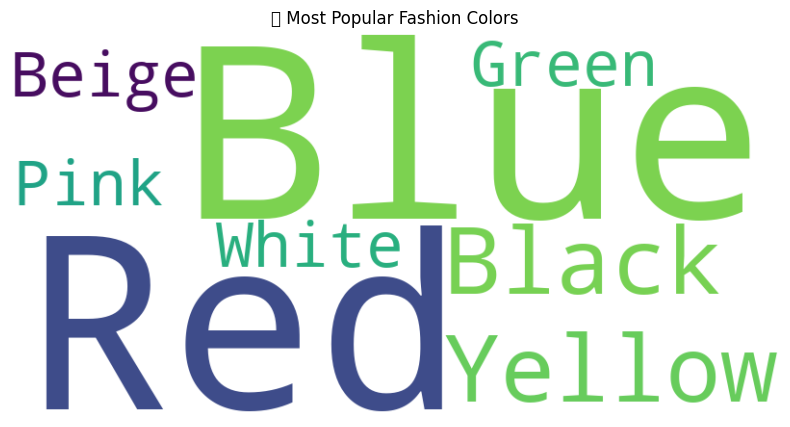

In [ ]:
### 5️⃣ Most Popular Fashion Colors (Word Cloud) ###
color_counts = Counter(df["Color"])
wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(color_counts)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("🎨 Most Popular Fashion Colors")
plt.show()

In [ ]:
! pip install dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 18.8 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: Flask
    Found existing installation: Flask 3.1.0
    Uninstalling Flask-3.1.0:
      Successfully uninstalled Flask-3.1.0


In [ ]:
! pip install pandas numpy plotly dash prophet


In [ ]:
# @title  Final Code

In [ ]:
import pandas as pd
import plotly.express as px
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
from prophet import Prophet


# Load dataset
#df = pd.read_csv("fashion_trend_data.csv")
df['Start_Date'] = pd.to_datetime(df['Start_Date'])

# Initialize Dash app
app = dash.Dash(__name__)

# Layout
app.layout = html.Div([
    html.H1("🔮 Fashion Trend Forecasting Dashboard", style={'textAlign': 'center'}),

    # Dropdowns for filtering
    html.Div([
        html.Label("Select Trend Feature:"),
        dcc.Dropdown(
            id="feature-dropdown",
            options=[
                {"label": "Trend Name", "value": "Trend_Name"},
                {"label": "Category", "value": "Category"},
                {"label": "Subcategory", "value": "Subcategory"},
                {"label": "Product Name", "value": "Product_Name"},
                {"label": "Brand", "value": "Brand"},
                {"label": "Material", "value": "Material"},
                {"label": "Color", "value": "Color"},
                {"label": "Region", "value": "Region"},
                {"label": "City", "value": "City"}
            ],
            value="Trend_Name",
            clearable=False
        ),
        html.Label("Select a Value:"),
        dcc.Dropdown(id="value-dropdown", clearable=False),
    ]),

    # Graph for Forecast
    dcc.Graph(id="forecast-graph"),

    # Additional Insights
    html.Div([
        html.H3("📊 Additional Insights", style={'textAlign': 'center'}),
        dcc.Graph(id="bar-chart"),
        dcc.Graph(id="pie-chart"),
    ])
])

# Update second dropdown based on feature selection
@app.callback(
    Output("value-dropdown", "options"),
    Input("feature-dropdown", "value")
)
def update_value_dropdown(selected_feature):
    options = [{"label": val, "value": val} for val in df[selected_feature].unique()]
    return options

# Forecasting Callback
@app.callback(
    Output("forecast-graph", "figure"),
    Input("feature-dropdown", "value"),
    Input("value-dropdown", "value")
)
def forecast_trend(selected_feature, selected_value):
    if not selected_value:
        return px.line(title="Select a value to generate forecast")

    # Prepare data
    trend_data = df[df[selected_feature] == selected_value].groupby("Start_Date").size().reset_index(name="Count")
    trend_data.rename(columns={"Start_Date": "ds", "Count": "y"}, inplace=True)

    # Train Prophet model
    model = Prophet(yearly_seasonality=True, daily_seasonality=False)
    model.fit(trend_data)

    # Future prediction
    future = model.make_future_dataframe(periods=365, freq="D")
    forecast = model.predict(future)

    # Visualization
    fig = px.line()
    fig.add_scatter(x=trend_data["ds"], y=trend_data["y"], mode="lines", name="Actual Trend")
    fig.add_scatter(x=forecast["ds"], y=forecast["yhat"], mode="lines", name="Forecasted Trend", line=dict(dash="dot"))

    fig.update_layout(title=f"📈 Forecast for {selected_value}", xaxis_title="Date", yaxis_title="Popularity Score")
    return fig

# Additional Insights: Bar Chart (Popularity Score)
@app.callback(
    Output("bar-chart", "figure"),
    Input("feature-dropdown", "value"),
    Input("value-dropdown", "value")
)
def generate_bar_chart(selected_feature, selected_value):
    if not selected_value:
        return px.bar(title="Select a value for insights")

    trend_data = df[df[selected_feature] == selected_value]
    fig = px.bar(trend_data, x="Brand", y="Popularity_Score", color="Brand", title="🔥 Brand Popularity Score")
    return fig

# Additional Insights: Pie Chart (Category Distribution)
@app.callback(
    Output("pie-chart", "figure"),
    Input("feature-dropdown", "value"),
    Input("value-dropdown", "value")
)
def generate_pie_chart(selected_feature, selected_value):
    if not selected_value:
        return px.pie(title="Select a value for insights")

    trend_data = df[df[selected_feature] == selected_value]
    fig = px.pie(trend_data, names="Category", title="👗 Fashion Category Distribution")
    return fig

# Run the Dash app
if __name__ == "__main__":
    app.run_server(debug=True)


<IPython.core.display.Javascript object>